Автор:<br>Коваленко А.О.
<br>Студент 2 курса магистратуры кафедры "ИУ3" МГТУ им. Н.Э. Баумана<br>

Основанно на [Tensorflow Object Detection API](https://github.com/tensorflow/models/tree/master/research/object_detection)
#### Ячейка под импорты модулей

In [2]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from glob import glob

%matplotlib inline
sys.path.append("..")

#### Иморт модулей Object Detection API

In [7]:
from utils import label_map_util
from utils import visualization_utils as vis_util

#### Вспомогательный код

In [75]:
'''
Выгрузка графа модели в память.
'''
def load_detection_graph(path_to_graph):
    detection_graph = tf.Graph()
    with detection_graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(path_to_graph, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
    return detection_graph

'''
Преобразование изображения в формат массива Numpy.
'''
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

'''
Распознавание.
'''
def detect_person_with_graph(detection_graph,image_paths_list):
    with detection_graph.as_default():
        with tf.Session(graph=detection_graph) as sess:
            # Объявление входных и выходных тензоров
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
            detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
            detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
            num_detections = detection_graph.get_tensor_by_name('num_detections:0')
            for image_path in image_paths_list:
                image = Image.open(image_path)
                image_np = load_image_into_numpy_array(image)
                # Размерность входного изображения должна быть: [1, None, None, 3]
                image_np_expanded = np.expand_dims(image_np, axis=0)
                # Распознавание.
                (boxes, scores, classes, num) = sess.run(
                    [detection_boxes, detection_scores, detection_classes, num_detections],
                    feed_dict={image_tensor: image_np_expanded})
                # Фильтруем детекции только для людей.
                l = list(zip(np.squeeze(boxes),np.squeeze(classes).astype(np.int32),np.squeeze(scores)))
                t = [t for t in l if t[1] == 1]
                b, c, s = list(zip(*t))
                np.array(b), np.array(c), np.array(s)
                # Визуализируем
                vis_util.visualize_boxes_and_labels_on_image_array(
                    image_np,
                    np.array(b),
                    np.array(c).astype(np.int32),
                    np.array(s),
                    category_index,
                    use_normalized_coordinates=True,
                    line_thickness=2)
                plt.figure(figsize=(12, 8))
                plt.imshow(image_np)

In [71]:
import collections
import PIL.ImageDraw as ImageDraw
import scipy.misc
def generate_camo_in_boxes(boxes,scores,alfa_image_path,min_score_thresh=.5):
    boxes_to_work = list()
    for i in range(boxes.shape[0]):
        if scores is None or scores[i] > min_score_thresh:
            box = tuple(boxes[i].tolist())
            boxes_to_work.append(box)

    alfa_image = Image.open(alfa_image_path).convert("RGBA")
    camo = Image.open('test_images/camo/camo.png').convert("RGBA")
    background = Image.new("RGBA", alfa_image.size)
    for box in boxes_to_work:
        ymin, xmin, ymax, xmax = box
        im_width, im_height = background.size
        (left, right, top, bottom) = (int(xmin * im_width), int(xmax * im_width),
                                  int(ymin * im_height), int(ymax * im_height))
        camo_layer_size = max(right-left,bottom-top)
        camo_layer = camo.resize([camo_layer_size,camo_layer_size], Image.BILINEAR)
        camo_layer = camo_layer.crop([0, 0, camo_layer_size/2,bottom-top])
        background.paste(camo_layer, (left, top), camo_layer)
    background.paste(alfa_image, (0, 0), alfa_image)
    plt.figure(figsize=(12, 8))
    plt.imshow(background)
    background = background.convert('RGB')
    scipy.misc.imsave('test_images/1.jpg',background)

#### Выгрузка карты лейблов

In [11]:
PATH_TO_TEST_IMAGES_DIR = 'test_images'
PATH_TO_LABELS = os.path.join('data', 'mscoco_label_map.pbtxt')
NUM_CLASSES = 1

label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

## 1 Список распознающих моделей

Ниже представлен эксперимент с распознающими моделями из [Tensorflow Object Detection Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md), обученных на датасете [COCO](http://cocodataset.org/#home)

1. Faster-RCNN Inception V2
>* **Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks.** *Shaoqing Ren, Kaiming He, Ross Girshick, Jian Sun.* [Arxiv 2016](https://arxiv.org/abs/1506.01497)
>* **Rethinking the Inception Architecture for Computer Vision.** *Christian Szegedy, Vincent Vanhoucke, Sergey Ioffe, Jonathon Shlens, Zbigniew Wojna.* [Arxiv 2015](https://arxiv.org/abs/1512.00567)

2. Faster-RCNN ResNet101
>* **Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks.** *Shaoqing Ren, Kaiming He, Ross Girshick, Jian Sun.* [Arxiv 2016](https://arxiv.org/abs/1506.01497)
>* **Deep Residual Learning for Image Recognition.** *Kaiming He, Xiangyu Zhang, Shaoqing Ren, Jian Sun.* [Arxiv 2015](https://arxiv.org/abs/1512.03385)

3. SSD Inception V2
>* **SSD: Single Shot MultiBox Detector.** *Wei Liu, Dragomir Anguelov, Dumitru Erhan, Christian Szegedy, Scott Reed, Cheng-Yang Fu, Alexander C. Berg. 	ECCV 2016.* [Arxiv 2016](https://arxiv.org/abs/1512.02325)
>* **Rethinking the Inception Architecture for Computer Vision.** *Christian Szegedy, Vincent Vanhoucke, Sergey Ioffe, Jonathon Shlens, Zbigniew Wojna.* [Arxiv 2015](https://arxiv.org/abs/1512.00567)

### 1.1 Faster-RCNN Inception V2

In [13]:
# Имя модели
MODEL_NAME = 'faster_rcnn_inception_v2_coco_2017_11_08'
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'
# Загрузка графа модели
detection_graph = load_detection_graph(PATH_TO_CKPT)

#### Изображение №1

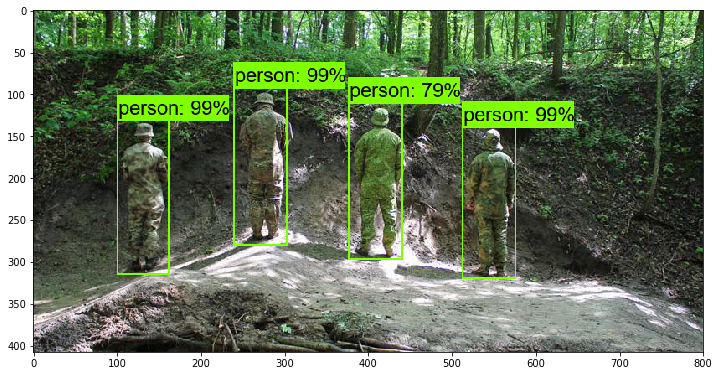

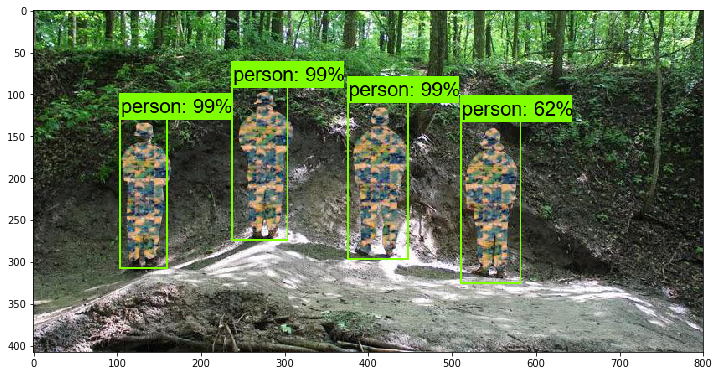

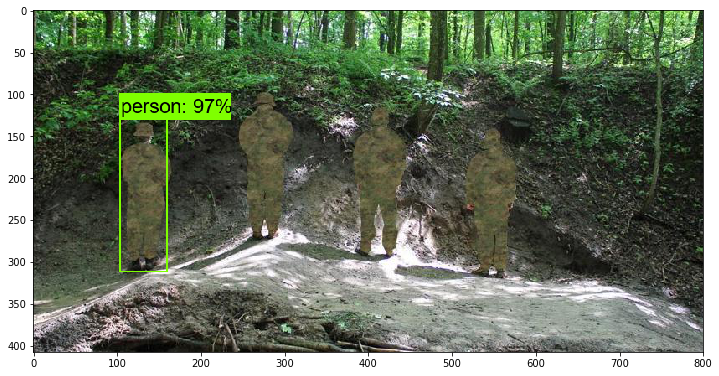

In [88]:
detect_person_with_graph(detection_graph,
                         [os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image1/{}.jpg'.format(i)) for i in range(1, 4) ])

#### Изображение №2

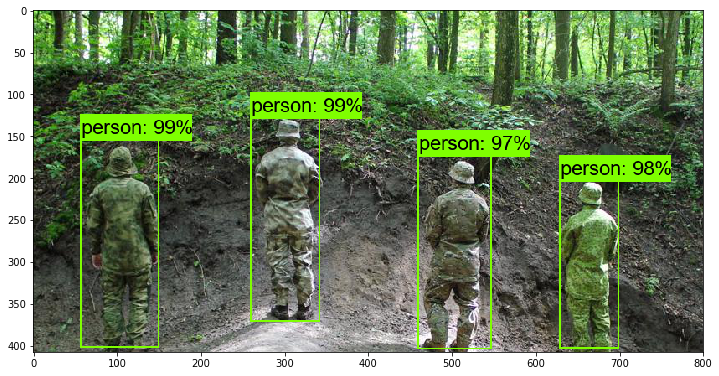

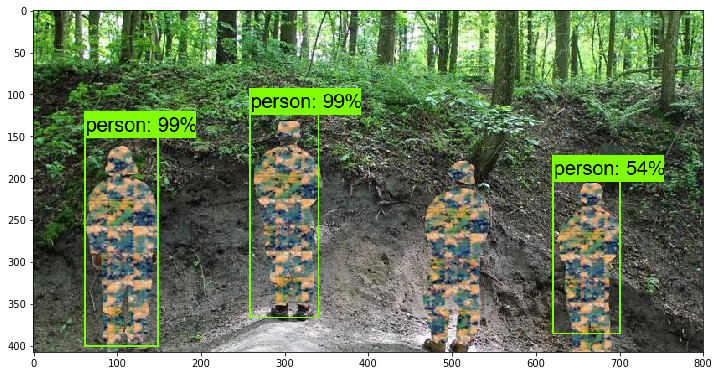

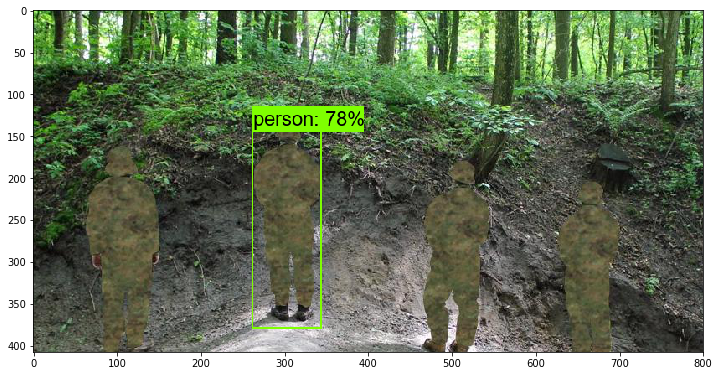

In [89]:
detect_person_with_graph(detection_graph,
                         [os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image2/{}.jpg'.format(i)) for i in range(1, 4) ])

#### Изображение №3

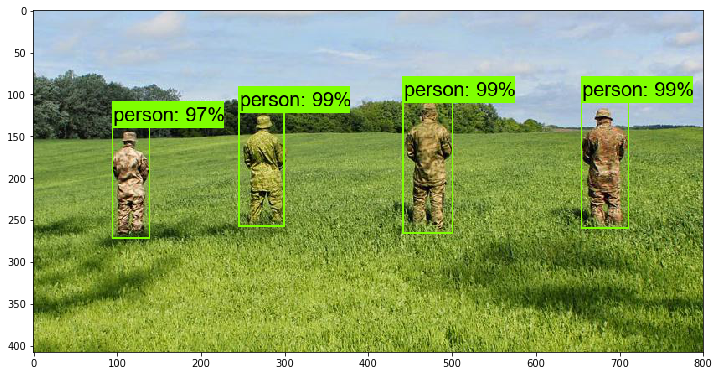

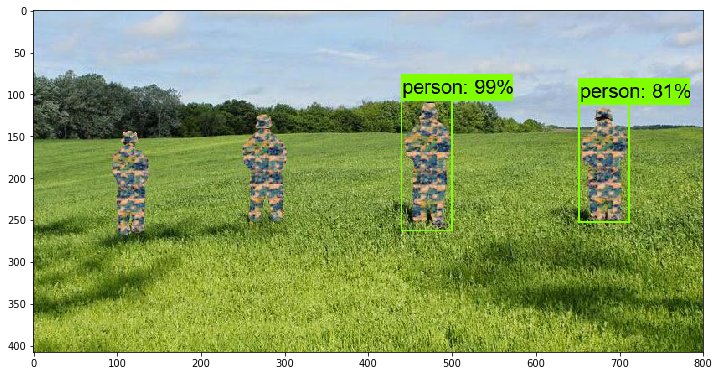

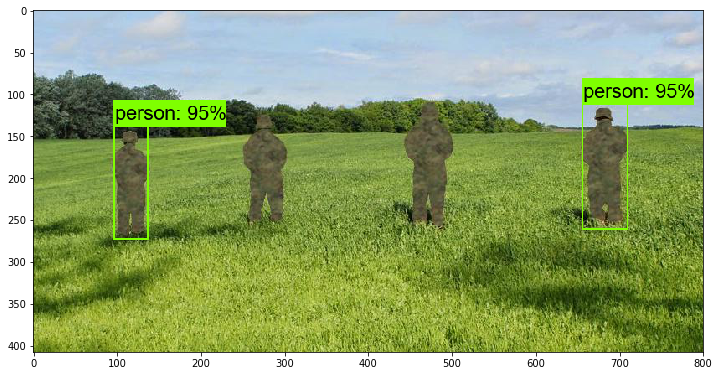

In [90]:
detect_person_with_graph(detection_graph,
                         [os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image3/{}.jpg'.format(i)) for i in range(1, 4) ])

### 1.2 Faster-RCNN ResNet101

In [93]:
# Имя модели
MODEL_NAME = 'faster_rcnn_resnet101_coco_2017_11_08'
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'
# Загрузка графа модели
detection_graph = load_detection_graph(PATH_TO_CKPT)

#### Изображение 1

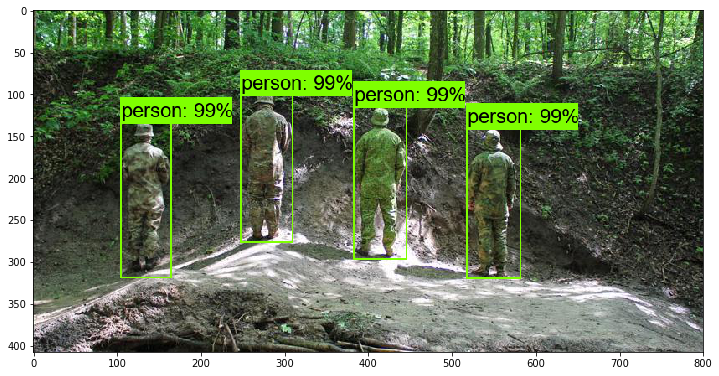

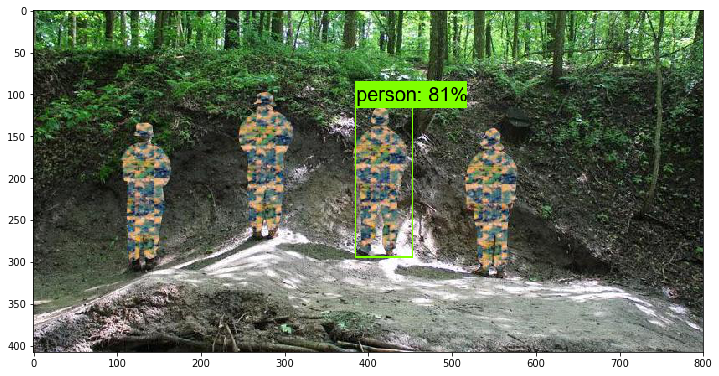

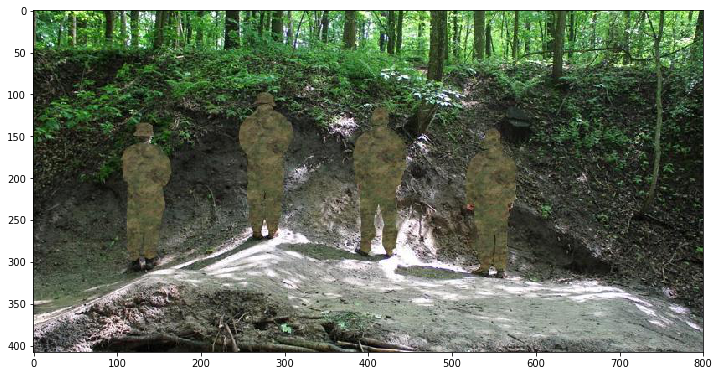

In [94]:
detect_person_with_graph(detection_graph,
                         [os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image1/{}.jpg'.format(i)) for i in range(1, 4) ])

#### Изображение 2

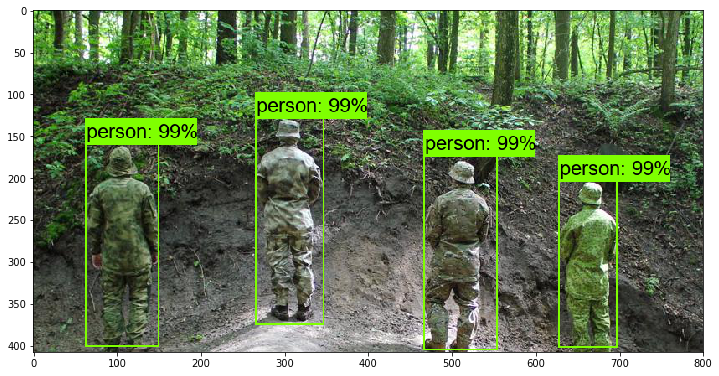

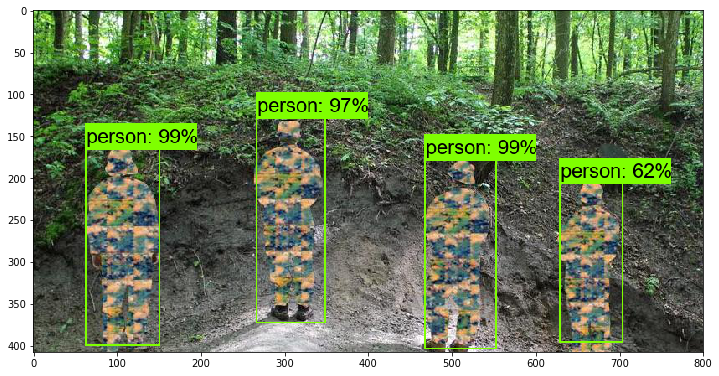

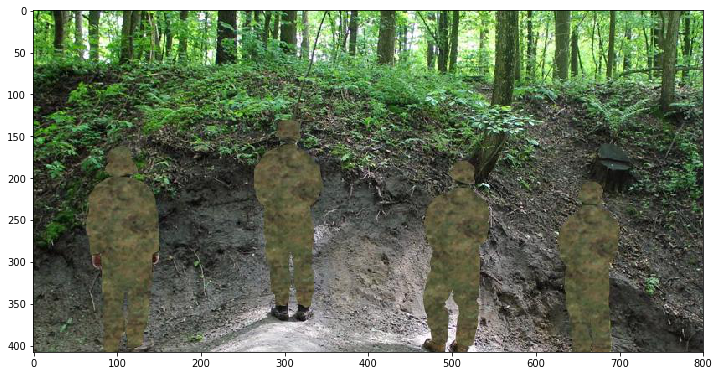

In [95]:
detect_person_with_graph(detection_graph,
                         [os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image2/{}.jpg'.format(i)) for i in range(1, 4) ])

#### Изображение 3

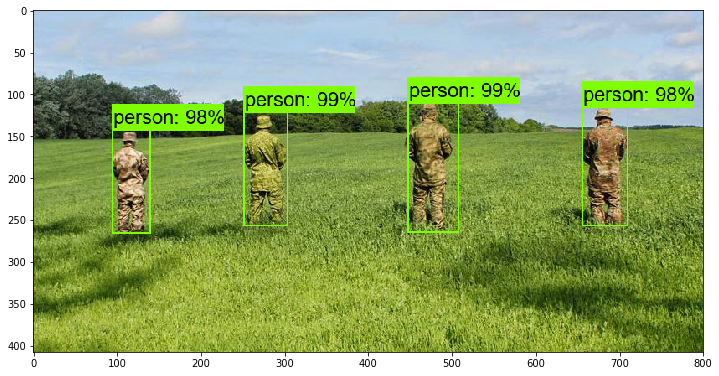

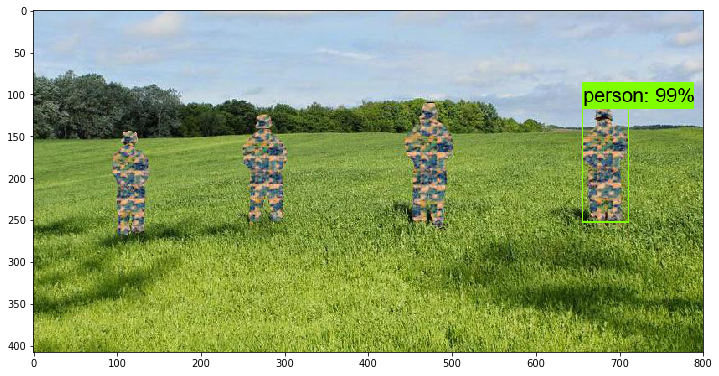

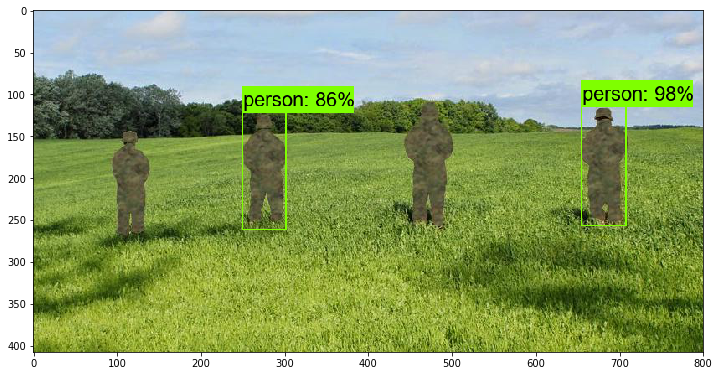

In [96]:
detect_person_with_graph(detection_graph,
                         [os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image3/{}.jpg'.format(i)) for i in range(1, 4) ])

### 1.3 SSD Inception V2 

In [97]:
# Имя модели
MODEL_NAME = 'ssd_inception_v2_coco_2017_11_17'
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'
# Загрузка графа модели
detection_graph = load_detection_graph(PATH_TO_CKPT)

#### Изображение 1

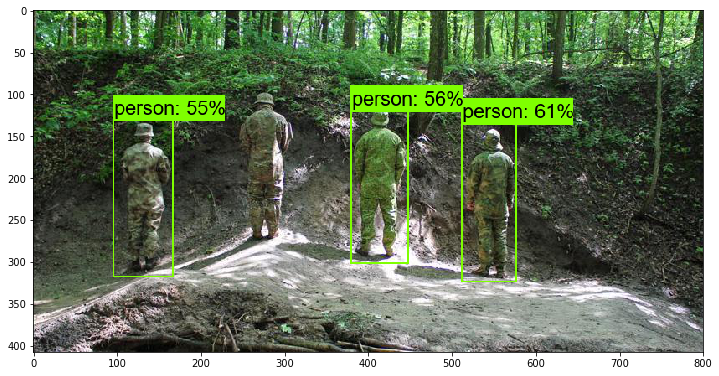

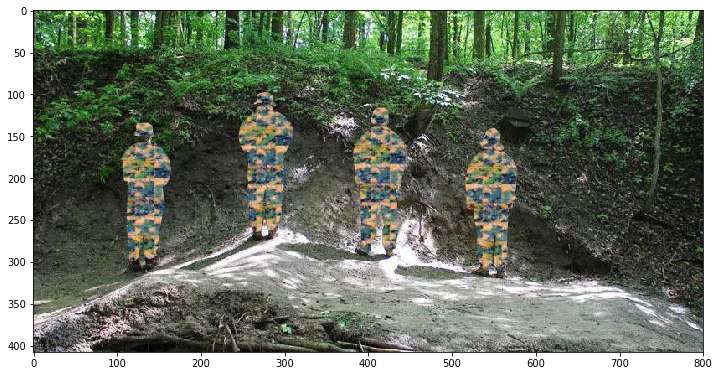

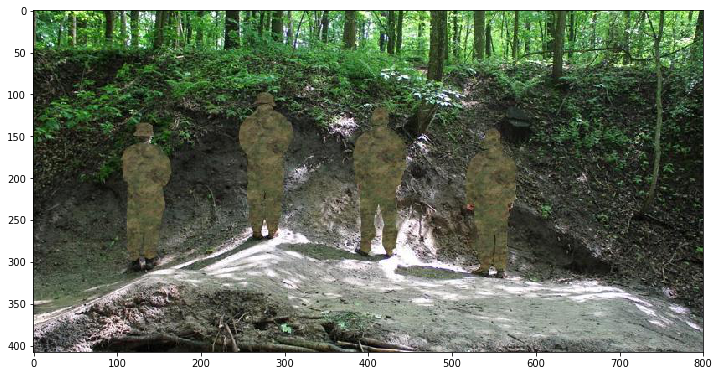

In [98]:
detect_person_with_graph(detection_graph,
                         [os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image1/{}.jpg'.format(i)) for i in range(1, 4) ])

#### Изображение 2

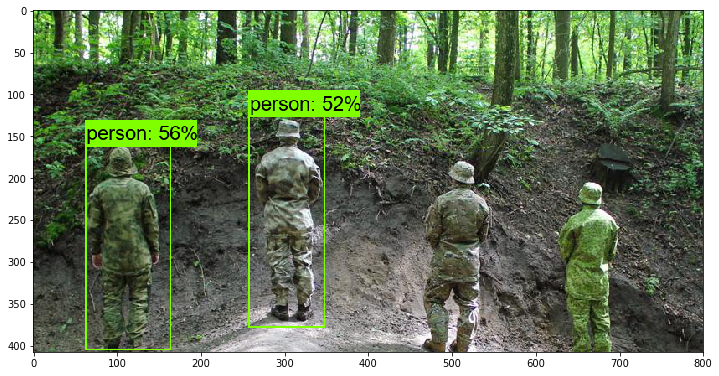

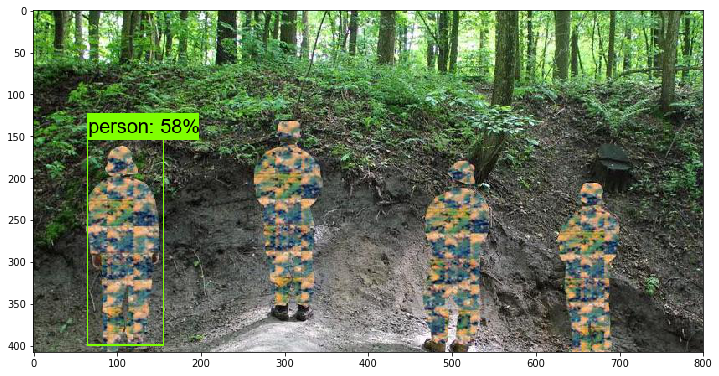

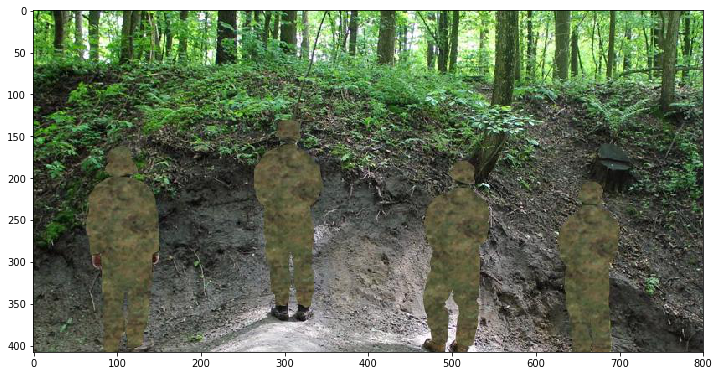

In [99]:
detect_person_with_graph(detection_graph,
                         [os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image2/{}.jpg'.format(i)) for i in range(1, 4) ])

#### Изображение 3

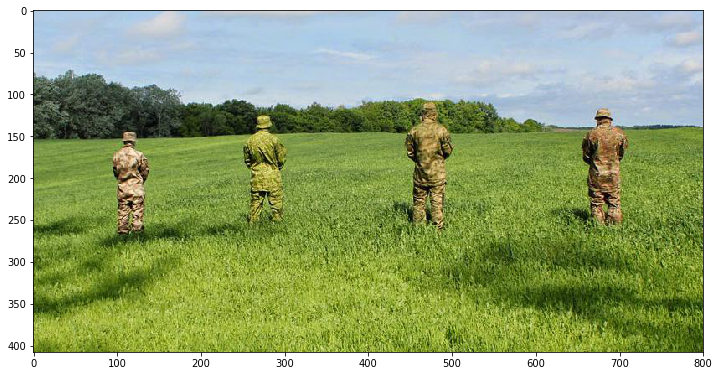

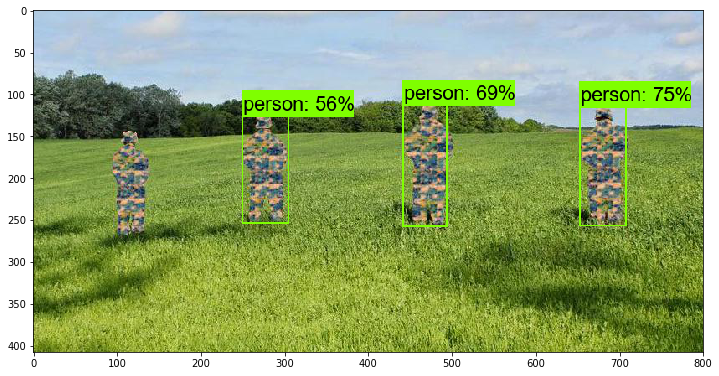

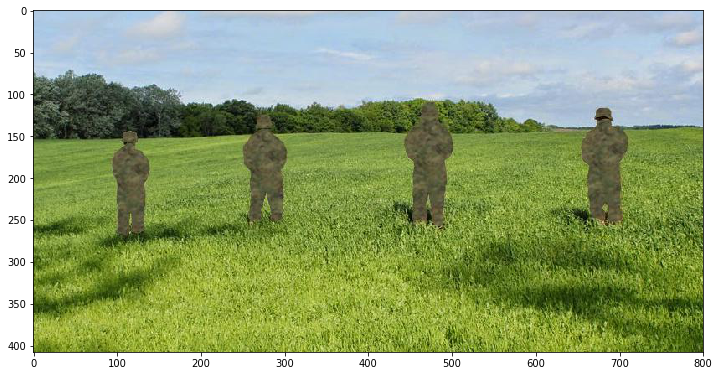

In [100]:
detect_person_with_graph(detection_graph,
                         [os.path.join(PATH_TO_TEST_IMAGES_DIR, 'image3/{}.jpg'.format(i)) for i in range(1, 4) ])